# without PCA

In [1]:
import numpy as np
import pandas as pd
import os

In [2]:
df = pd.read_csv('datasets/mnist_train.csv')
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [3]:
df.shape

(42000, 785)

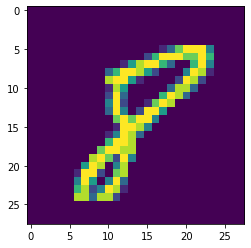

In [4]:
import matplotlib.pyplot as plt

#df.iloc[] is a property that is used to select rows and columns by position/index.
plt.imshow(df.iloc[18306,1:].values.reshape(28,28))
# The .reshape() function rearranges the data in an ndarray into a new shape. 
# The new shape must be compatible with the old one

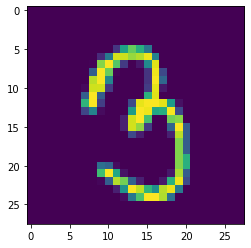

In [5]:
plt.imshow(df.iloc[18351,1:].values.reshape(28,28))


In [6]:
x=df.iloc[:,1:]
y=df.iloc[:,0]

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.2, random_state=42)

In [7]:
x_train.shape

(33600, 784)

In [8]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()    #make its object
knn.fit(x_train, y_train) 
# you cal distance of given img with all its neightbours
# you understand which is similar image to the given image
# if similar images are of "8" then new image will also be "8"

KNeighborsClassifier()

 Here distance of one image is calculated with all other 33600 images
 then you sort and find which are nearest neighbours
 then label of the similar image is found out

In [9]:
# this step will take lot of time as it is working with a high dimensional data
import time
start = time.time()
y_pred = knn.predict(x_test)
print(time.time()-start)
# in secs

34.413453102111816


In [10]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred)

0.9648809523809524

# with PCA

In [19]:
x=df.iloc[:,1:]
y=df.iloc[:,0]

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.2, random_state=42)


In [20]:
# standarize data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()    #make its object

x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [21]:
# PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=None)
# n_components => number of components you want on pca, 
# if set to none then no. of component = no of parameters

In [22]:
# here we found eigen values and shifted/transformed coordinate axis to new axis
x_train_trf = pca.fit_transform(x_train)
x_test_trf = pca.transform(x_test)
x_train.shape

(33600, 784)

In [27]:
# Now lets take only top 100 components/columns
# trf=transform
pca = PCA(n_components=200)
x_train_trf = pca.fit_transform(x_train)
x_test_trf = pca.transform(x_test)
x_train.shape

(33600, 784)

In [28]:
# train the data
knn = KNeighborsClassifier()
knn.fit(x_train_trf, y_train)

KNeighborsClassifier()

In [29]:
y_pred = knn.predict(x_test_trf)

In [30]:
accuracy_score(y_test, y_pred)

0.9504761904761905

In [31]:
for i in range(1, 784):
    pca = PCA(n_components=i)
    x_train_trf = pca.fit_transform(x_train)
    x_test_trf = pca.transform(x_test)
    knn = KNeighborsClassifier()
    knn.fit(x_train_trf, y_train)
    y_pred = knn.predict(x_test_trf)
    print(accuracy_score(y_test, y_pred) )   

0.2588095238095238
0.32357142857142857
0.5101190476190476
0.6661904761904762
0.7376190476190476
0.8223809523809524
0.8442857142857143
0.8717857142857143
0.8866666666666667
0.9066666666666666
0.911547619047619
0.9179761904761905
0.9286904761904762
0.935
0.9395238095238095
0.9379761904761905
0.9396428571428571
0.9408333333333333
0.9421428571428572
0.9441666666666667
0.9444047619047619
0.9441666666666667
0.9457142857142857
0.945595238095238
0.9477380952380953
0.9478571428571428
0.9470238095238095
0.9473809523809524
0.9497619047619048
0.950595238095238
0.9513095238095238
0.9515476190476191
0.9520238095238095
0.9508333333333333
0.9515476190476191


KeyboardInterrupt: 

##  Visualise

In [32]:
# transforming into 2D cord system
pca = PCA(n_components=2)        #now every datapoint has 2 dimensions 
x_train_trf = pca.fit_transform(x_train)
x_test_trf = pca.transform(x_test)
x_train_trf

array([[-2.7186112 , -0.4898457 ],
       [-0.67700098, -6.75358036],
       [-3.03326094,  6.50991732],
       ...,
       [ 2.1488602 ,  0.78023864],
       [ 1.05960809,  0.94746611],
       [17.70264016,  1.96190346]])

In [33]:
# plotly is used for dynamic visualization 
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=x_train_trf[:,0],
                y=x_train_trf[:,1],
                color=y_train_trf,
                color_discrete_sequence=px.colors.qualitative.G10)

fig.show()
# bringing 784 dimensional data into 2 dimensions

In [34]:
# transforming into 3D cord system
pca = PCA(n_components=3)        #now every datapoint has 3 dimensions 
x_train_trf = pca.fit_transform(x_train)
x_test_trf = pca.transform(x_test)
x_train_trf

array([[-2.71858785, -0.4902076 ,  1.13500927],
       [-0.67704544, -6.75358927, -2.33608836],
       [-3.03324312,  6.50965679,  7.49184908],
       ...,
       [ 2.14879439,  0.78146127, -0.74661183],
       [ 1.05959331,  0.94694945,  3.94866591],
       [17.70242935,  1.95998304, -4.94658307]])

In [43]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df,x=x_train_trf[:,0],
                y=x_train_trf[:,1],
                z=x_train_trf[:,2],
                color=y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20)
)
fig.show()
# bringing 784 dimensional data into 2 dimensions

## eigen value and vector

In [44]:
# pca has this parameter
# explained_variance are the eigen values
# these are top 3 eigen values as we did 3D
pca.explained_variance_

array([40.67111197, 29.17023354, 26.74459482])

In [45]:
# eigen vectors:
pca.components_

array([[-2.60608935e-17,  4.42765169e-19,  8.23909065e-20, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 2.15631255e-17,  2.07840395e-18, -2.62138000e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-6.94347949e-17,  4.81847872e-18, -3.85326933e-18, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [46]:
pca.components_.shape
# we have 3 vectors, each with 784 coponents, as it has 784 components in data 
# we have a 784 dimesional data and from that we found out 3 vectors

(3, 784)

* Eigen value tell that how much variance of the data  can this principle component(PC) indivisually explain/give. 
* In 784 dimensional data, there are 784 eigen values
* each eigen vector kitna percent of variance explain karta hai

lambda1, lambda2, lambda3...
combining we need 90% variance from the eigen vectors
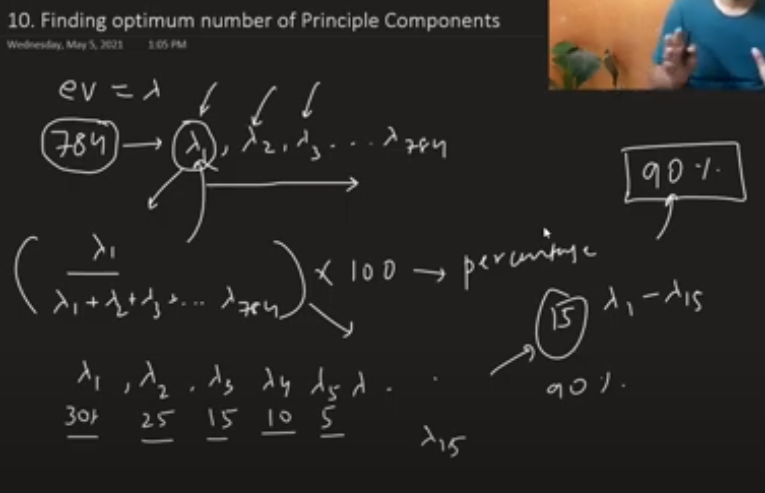

## find out optimal number of PCs for max model performance

In [47]:
pca.explained_variance_ratio_
# gives % value of how much variance can this Eigen vector can give 
# so the first eigrn vector is explaining 5% variance of the original data
# explaining variance means 5% of the data is being able to capture if we only take this vector (new transformed axis)
# if thses 3 eigen vectors are combined then it will explain 12% of original data

array([0.05785192, 0.0414927 , 0.03804239])

In [49]:
pca = PCA(n_components=None)
x_train_trf = pca.fit_transform(x_train)
x_test_trf = pca.transform(x_test)
pca.explained_variance_.shape

(784,)

In [51]:
# 784 PCs in 784 dimensional space
pca.components_.shape

(784, 784)

In [52]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

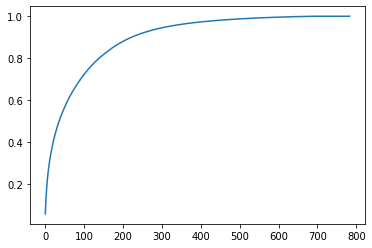

In [54]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
# 90% variance is explained by 250 PCs (from the graph)